# Text processing with Polars

Author: Antons Tocilins-Ruberts

In [16]:
import numpy

numpy.__version__

'1.23.5'

## Imports

In [6]:
import string
from nltk.corpus import stopwords

import numpy as np
import pandas as pd
import polars as pl

from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer

from utils.read_data import load_emails_txt
from utils.feature_generation import extract_fields, email_features
from utils.preprocess import email_clean, tokenise_text, remove_stopwords
from utils.plots import generate_word_cloud

Set the stopwords for further processing

In [3]:
stops = set(
    stopwords.words("english")
    + [l for l in string.ascii_lowercase]
    + [
        "",
        "nbsp",
        "content",
        "type",
        "text",
        "charset",
        "iso",
        "qzsoft",
        "encoding",
        "seperator",
        "directmail",
        "quoted",
        "printable",
    ]
)

## Text Pipeline

In [4]:
emails = load_emails_txt("fradulent_emails.txt")
emails_pl = pl.DataFrame({"emails": emails[1:]})

emails_pl = (
    emails_pl.pipe(extract_fields)
    .pipe(email_features, "email_text")
    .pipe(email_features, "sender_email")
    .pipe(email_features, "subject")
    .pipe(email_clean, "email_text")
    .pipe(email_clean, "sender_name")
    .pipe(email_clean, "subject")
    .pipe(tokenise_text, "email_text")
    .pipe(tokenise_text, "subject")
    .pipe(remove_stopwords, stops, "email_text_tokenised")
    .pipe(remove_stopwords, stops, "subject_tokenised")
)


The predicate '[(col("").is_in([Series]).is_not()) & ([(col("").str.n_chars()) > (2)])]' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change


## Visual Analysis

### All Texts

In [7]:
text_list = emails_pl.select(pl.col("email_text_tokenised").arr.join(" "))[
    "email_text_tokenised"
].to_list()
all_emails = " ".join(text_list)

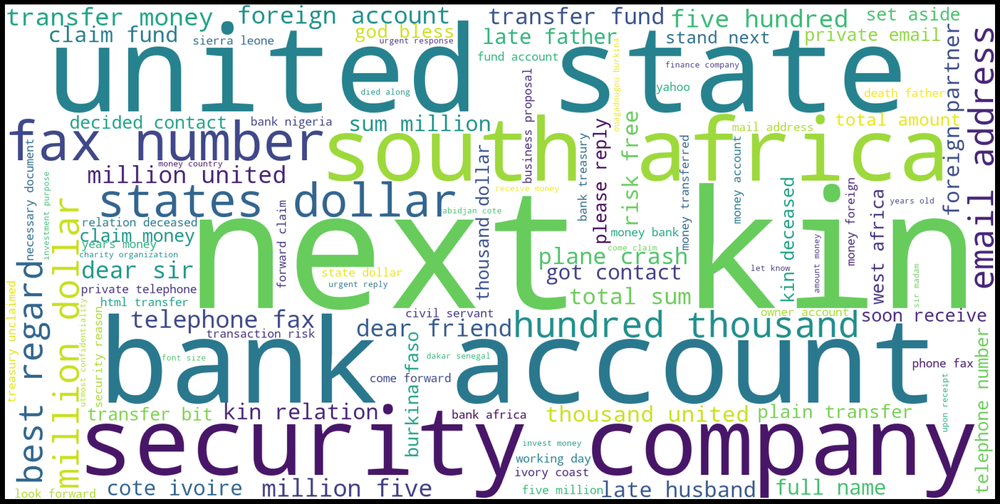

In [8]:
# Generate a word cloud image
generate_word_cloud(all_emails)

### Cluster

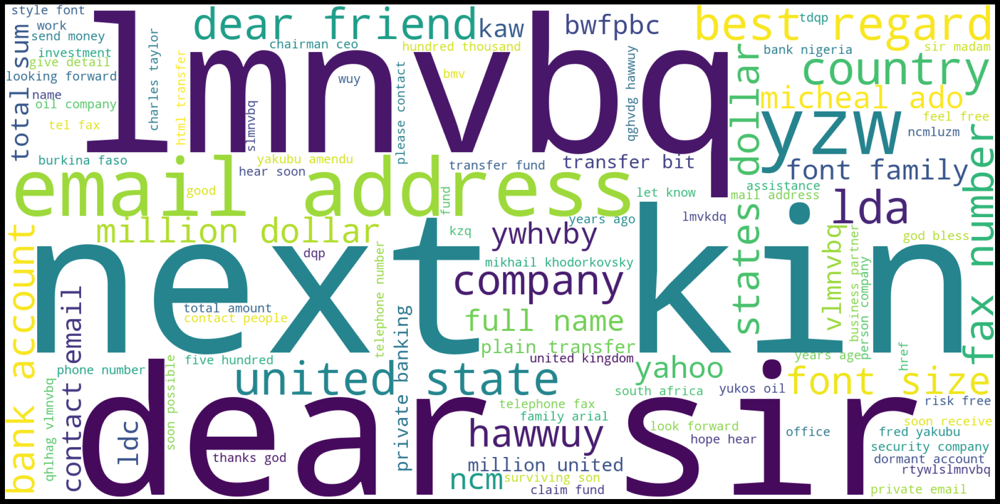

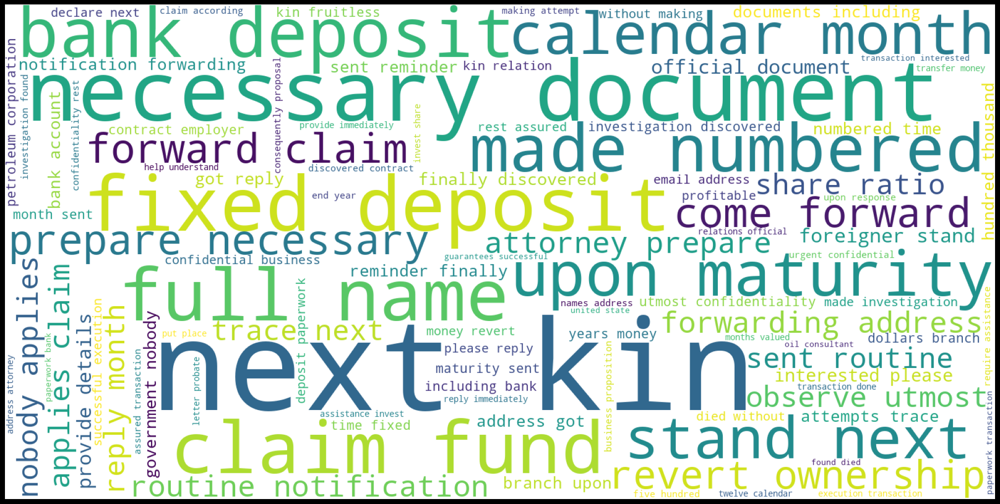

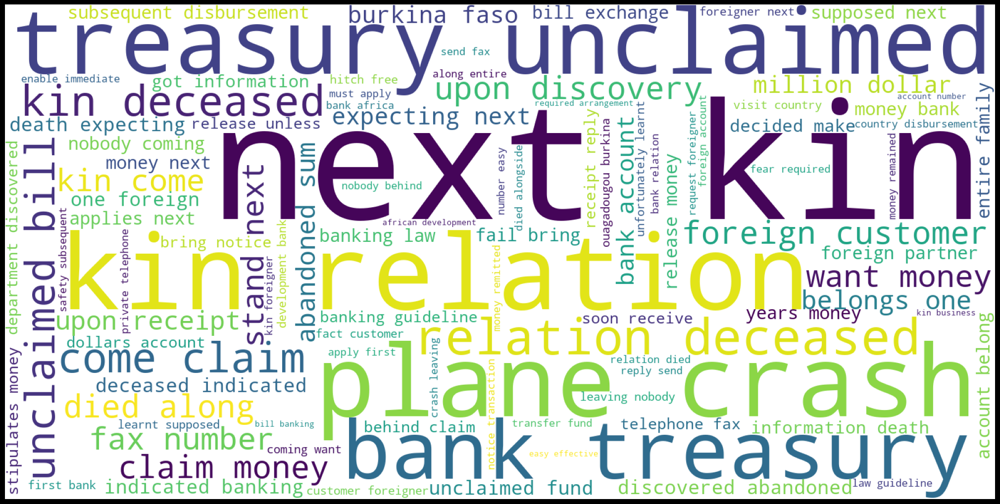

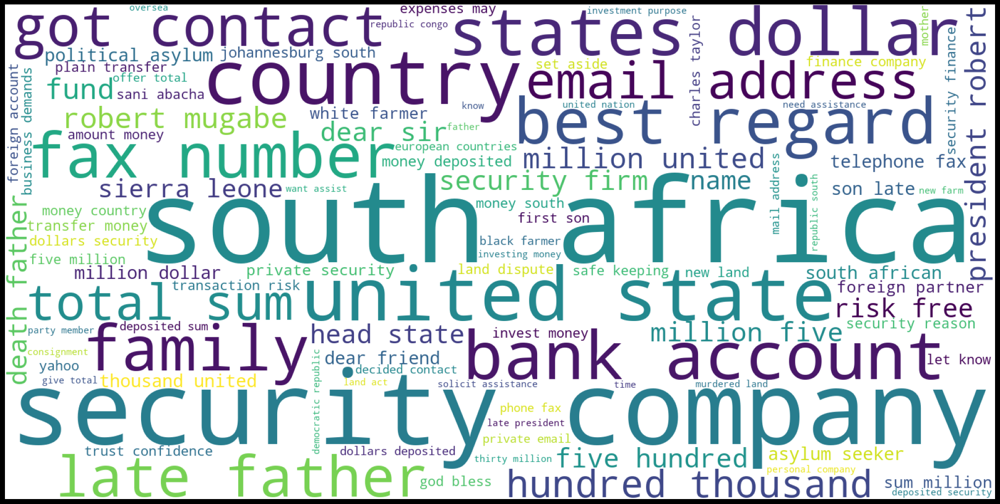

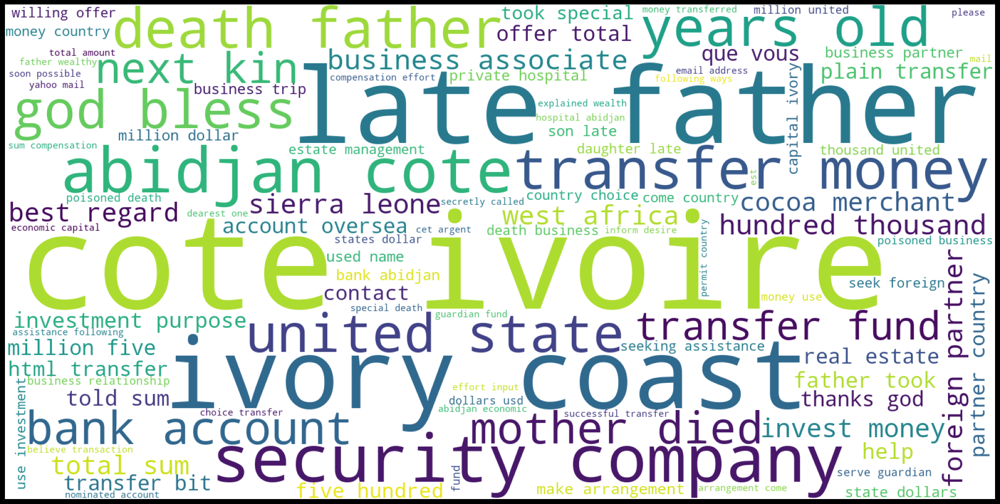

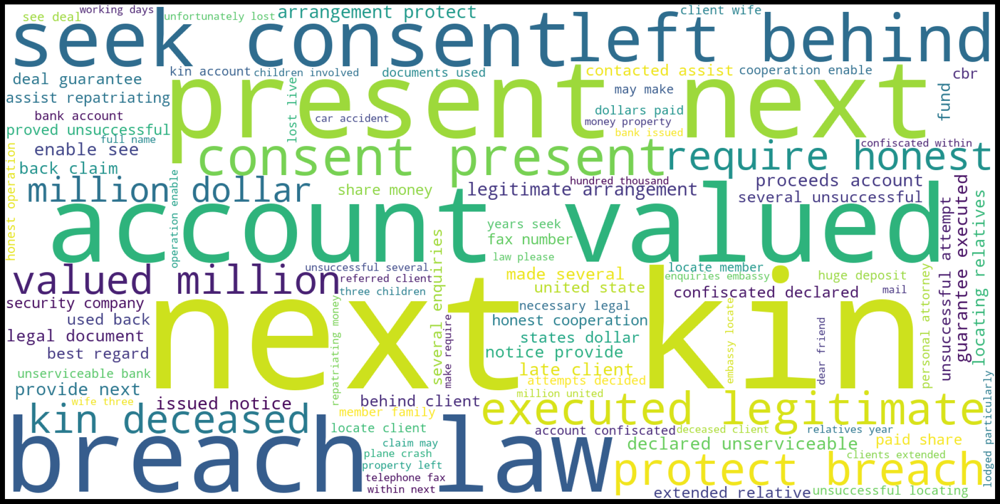

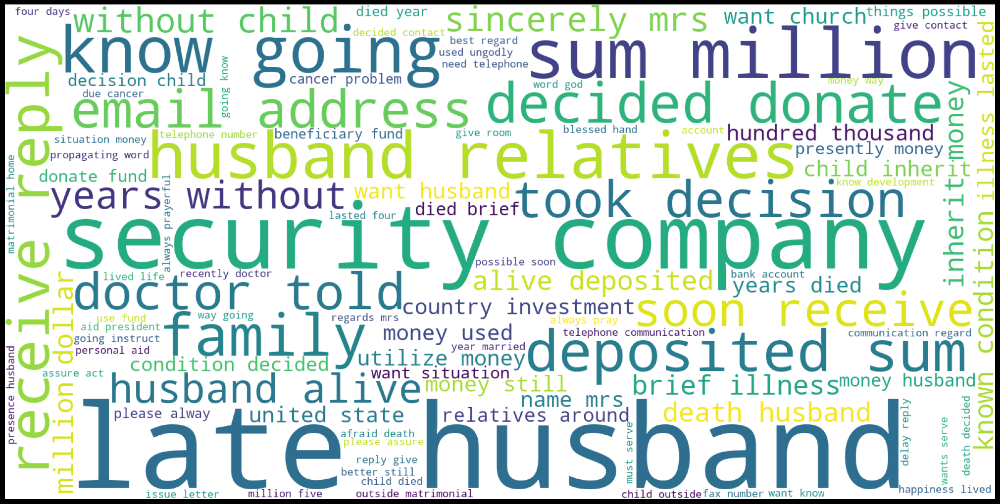

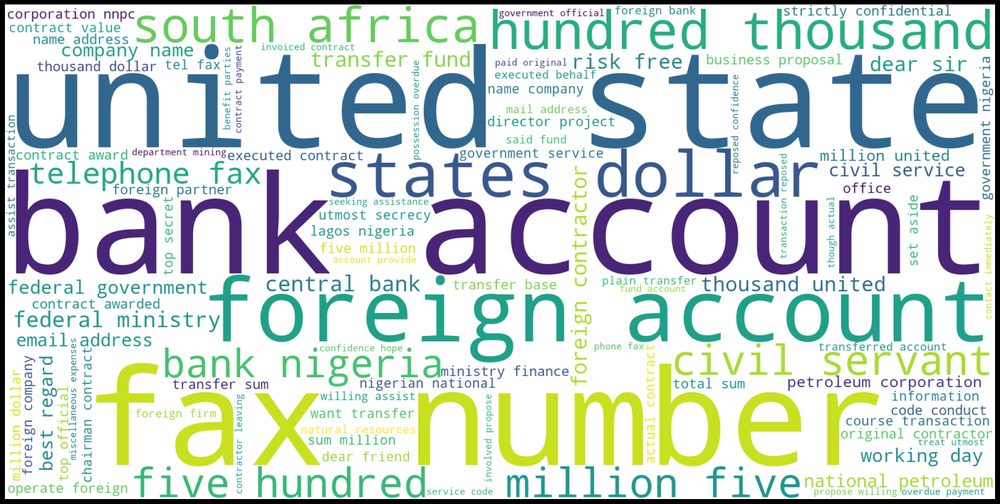

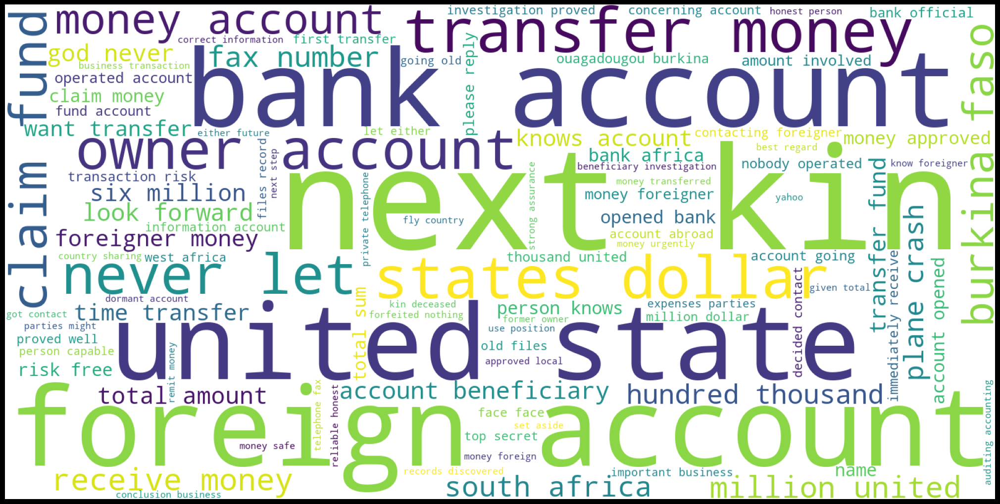

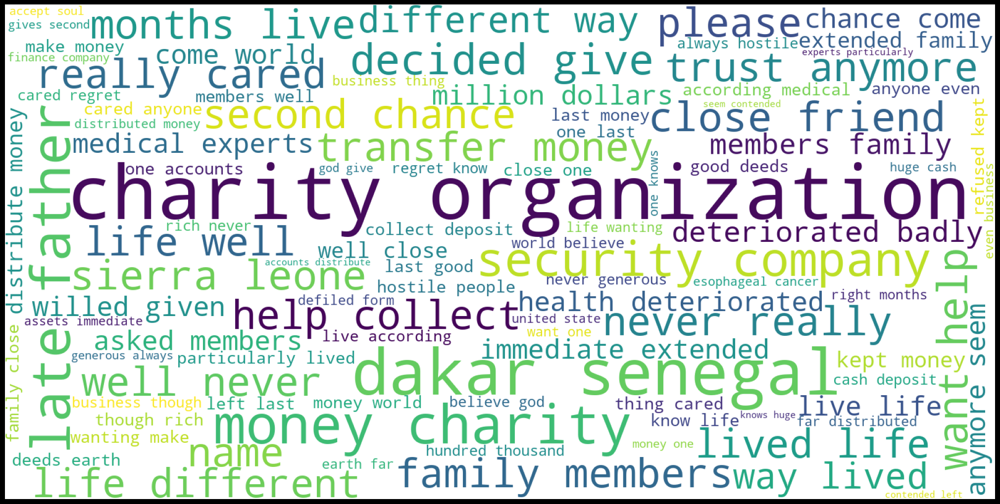

In [9]:
# TF-IDF with 500 words
vectorizer = TfidfVectorizer(max_features=500)
transformed_text = vectorizer.fit_transform(text_list)
tf_idf = pd.DataFrame(transformed_text.toarray(), columns=vectorizer.get_feature_names_out())

# Cluster into 10 clusters
n = 10
cluster = KMeans(n_clusters=n, n_init='auto')
clusters = cluster.fit_predict(tf_idf)

for c in range(n):
    cluster_texts = np.array(text_list)[clusters==c]
    cluster_text = ' '.join(list(cluster_texts))
    
    generate_word_cloud(cluster_text)